In [1]:
import numpy as np
import os
import glob
import re
from collections import Counter
from pathlib import Path
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy import signal
from scipy.ndimage import zoom

In [ ]:
def parse_psf_locations(target_dir, variation_number, dead_fields=None):
    psf_locations = {}
    psfs = os.path.join(target_dir, f"variant_{variation_number}")
    for file_name in glob.glob(os.path.join(psfs, "*.txt")):
        field_number = int(file_name.split("Field")[-1].split("_")[0])
        if field_number in psf_locations:
            continue
        if dead_fields and field_number in dead_fields:
            continue

        with open(file_name, 'r', encoding='utf-16') as f:
            content = f.read()
        lines = content.strip().split('\n')

        for i, line in enumerate(lines):
            line = line.strip()
            # extracting field position. format: "z.zzzz µm at x.xxxx, y.yyyy"
            if 'µm at' in line and 'deg' in line:
                match = re.search(r'([\d.]+)\s*µm at\s*([-\d.]+),\s*([-\d.]+)\s*', line)
                if match:
                    field_x_deg, field_y_deg = float(match.group(2)), float(match.group(3))
                    if field_number not in psf_locations:
                        psf_locations[field_number] = (field_x_deg, field_y_deg)

    return psf_locations

In [3]:
def parse_psf_kernel(file_path):
    with open(file_path, 'r', encoding='utf-16') as f:
        content = f.read()
    lines = content.strip().split('\n')

    data_start_idx = None
    for i, line in enumerate(lines):
        line = line.strip()
        if line and re.match(r'^\s*[-+]?\d+\.?\d*[Ee][-+]?\d+', line):
            data_start_idx = i
            break

    if data_start_idx is None:
        raise ValueError(f"Could not find numeric data in {file_path}")

    psf = []
    for line in lines[data_start_idx:]:
        line = line.strip()
        if line:
            row_values = []
            for val in line.split('\t'):
                val = val.strip()
                if val:
                    try:
                        row_values.append(float(val))
                    except ValueError:
                        continue
            if row_values:
                psf.append(row_values)

    return np.array(psf, dtype=np.float32)

In [4]:
def read_rgb_psf_kernels(target_dir, variation_number, field):
    psf_b_file = os.path.join(
        target_dir,
        f"variant_{variation_number}",
        f"PSF_Field{field}_Wavelength{1}_filenumber{variation_number}_.txt"
        )

    psf_g_file = os.path.join(
        target_dir,
        f"variant_{variation_number}",
        f"PSF_Field{field}_Wavelength{2}_filenumber{variation_number}_.txt"
        )

    psf_r_file = os.path.join(
        target_dir,
        f"variant_{variation_number}",
        f"PSF_Field{field}_Wavelength{3}_filenumber{variation_number}_.txt"
        )

    psf_kernel_b = parse_psf_kernel(psf_b_file)
    psf_kernel_g = parse_psf_kernel(psf_g_file)
    psf_kernel_r = parse_psf_kernel(psf_r_file)

    psf_kernel_r = psf_kernel_r / (np.sum(psf_kernel_r) + 1e-10)
    psf_kernel_g = psf_kernel_g / (np.sum(psf_kernel_g) + 1e-10)
    psf_kernel_b = psf_kernel_b / (np.sum(psf_kernel_b) + 1e-10)

    rgb_psf_kernel = np.stack([psf_kernel_r, psf_kernel_g, psf_kernel_b], axis=-1)

    return rgb_psf_kernel

In [5]:
def build_psf_library(target_dir, variation_number, dead_fields=None, output_path=None):
    psf_locations = parse_psf_locations(target_dir, variation_number, dead_fields=dead_fields)
    num_fields = len(psf_locations)

    field_numbers = sorted(psf_locations.keys())
    field_positions = np.array([psf_locations[f] for f in field_numbers], dtype=np.float32)

    psf_kernels = {}
    for field in field_numbers:
        rgb_psf = read_rgb_psf_kernels(target_dir, variation_number, field)
        psf_kernels[field] = rgb_psf

    save_dict = {
        'variation_number': variation_number,
        'field_numbers': np.array(field_numbers, dtype=np.int32),
        'field_positions_degrees': field_positions,
    }

    for field in field_numbers:
        save_dict[f'psf_field_{field}'] = psf_kernels[field]

    print(f"Library summary:")
    print(f"Variant: {variation_number}")
    print(f"Number of Fields: {num_fields}")
    print(f"Each PSF kernel shape: {psf_kernels[field_numbers[0]].shape}")
    print(f"Field extent:")
    print(f"X=[{field_positions[:, 0].min():.3f}, {field_positions[:, 0].max():.3f}] degrees")
    print(f"Y=[{field_positions[:, 1].min():.3f}, {field_positions[:, 1].max():.3f}] degrees")

    if output_path is None:
        output_path = os.path.join(target_dir, f"psf_library_variant_{variation_number}.npz")

    np.savez_compressed(output_path, **save_dict)
    print(f"PSF Library Saved to: {output_path}")

In [6]:
def load_psf_library(library_path):
    data = np.load(library_path)
    variation_number = int(data['variation_number'])
    field_numbers = data['field_numbers']
    field_positions = data['field_positions_degrees']
    psf_kernels = {}

    for field in field_numbers:
        psf_kernels[field] = data[f'psf_field_{field}']

    psf_library = {
        'variation_number': variation_number,
        'field_numbers': field_numbers,
        'field_positions_degrees': field_positions,
        'psf_kernels': psf_kernels
    }

    print(f"Loaded PSF library for variant: {psf_library['variation_number']}")

    return psf_library

In [35]:
def visualize_psf_grid(psf_library, crop_size=128, save_path=None):
    variant = psf_library['variation_number']
    field_numbers = psf_library['field_numbers']
    field_positions = psf_library['field_positions_degrees']

    x_positions = field_positions[:, 0]
    y_positions = field_positions[:, 1]

    unique_x = np.unique(x_positions)
    unique_y = np.unique(y_positions)

    x_min, x_max = x_positions.min(), x_positions.max()
    y_min, y_max = y_positions.min(), y_positions.max()

    # mapping positions to grid indices
    x_to_idx = {x: i for i, x in enumerate(sorted(unique_x))}
    y_to_idx = {y: i for i, y in enumerate(sorted(unique_y, reverse=True))}  # reversed for image coordinates

    _, axes = plt.subplots(1, 2, figsize=(16, 8))

    # field layout plot
    square = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, fill=False, linestyle='--')
    axes[0].add_patch(square)

    axes[0].scatter(
        field_positions[:, 0], field_positions[:, 1], 
        c=['red' if i == 0 and j == 0 else 'green' for i, j in zip(field_positions[:, 0], field_positions[:, 1])], 
        alpha=0.7, linewidth=1
        )

    for i, field_num in enumerate(field_numbers):
        axes[0].annotate(f'{field_num}', (field_positions[i, 0] + 0.1, field_positions[i, 1] + 0.1), fontsize=8)

    axes[0].grid(True, alpha=0.3, linestyle='--')    
    axes[0].set_xlabel('Field X (degrees)', fontsize=12)
    axes[0].set_ylabel('Field Y (degrees)', fontsize=12)
    axes[0].set_xticks(np.arange(np.floor(x_min), np.ceil(x_max) + 1))
    axes[0].set_yticks(np.arange(np.floor(y_min), np.ceil(y_max) + 1))
    axes[0].set_title(f'PSF Field Layout: Variant - {variant}, Fields - {len(field_numbers)}', fontsize=14)

    # psf mosaic plot
    grid_height = len(unique_y)
    grid_width = len(unique_x)

    # creating empty canvas
    canvas_height = grid_height * crop_size
    canvas_width = grid_width * crop_size
    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.float32)

    # placing each PSF in the canvas
    for idx, field in enumerate(field_numbers):
        rgb_psf = psf_library['psf_kernels'][field]
        pos = field_positions[idx]

        # getting grid position
        grid_x = x_to_idx[pos[0]]
        grid_y = y_to_idx[pos[1]]

        # cropping to center of PSF
        H, W = rgb_psf.shape[:2]
        center_y, center_x = H // 2, W // 2
        half_crop = crop_size // 2

        y1 = max(0, center_y - half_crop)
        y2 = min(H, center_y + half_crop)
        x1 = max(0, center_x - half_crop)
        x2 = min(W, center_x + half_crop)

        rgb_crop = rgb_psf[y1:y2, x1:x2, :]

        # normalizing for displaying
        rgb_crop = rgb_crop / (rgb_crop.max() + 1e-10)

        # placing in canvas
        canvas_y1 = grid_y * crop_size
        canvas_y2 = canvas_y1 + rgb_crop.shape[0]
        canvas_x1 = grid_x * crop_size
        canvas_x2 = canvas_x1 + rgb_crop.shape[1]

        canvas[canvas_y1:canvas_y2, canvas_x1:canvas_x2, :] = rgb_crop

    # applying sqrt for better visualization
    canvas_display = np.sqrt(canvas)
    # canvas_display = np.power(canvas_display, 0.5)
    # canvas_display = np.clip(canvas_display, 0, 1.0)

    axes[1].imshow(canvas_display)
    axes[1].set_title(f'Spatially Arranged PSF Sensor Map Mosaic: {grid_height} x {grid_width} grid, '
                 f'Variant: {variant}, Fields: {len(field_numbers)}')

    # adding grid lines
    for i in range(1, grid_width):
        axes[1].axvline(x=i*crop_size, color='white', linewidth=0.5, alpha=0.3)
    for i in range(1, grid_height):
        axes[1].axhline(y=i*crop_size, color='white', linewidth=0.5, alpha=0.3)

    # adding position labels
    for idx, field in enumerate(field_numbers):
        pos = field_positions[idx]
        grid_x = x_to_idx[pos[0]]
        grid_y = y_to_idx[pos[1]]

        text_x = grid_x * crop_size + crop_size // 2
        text_y = grid_y * crop_size + crop_size - 10

        axes[1].text(text_x, text_y, f'F{field}',
               fontsize=8, color='yellow', ha='center', va='bottom',
               bbox=dict(boxstyle='round, pad=0.3', facecolor='black', alpha=0.5))

    axes[1].axis('off')
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

Loaded PSF library for variant: 1


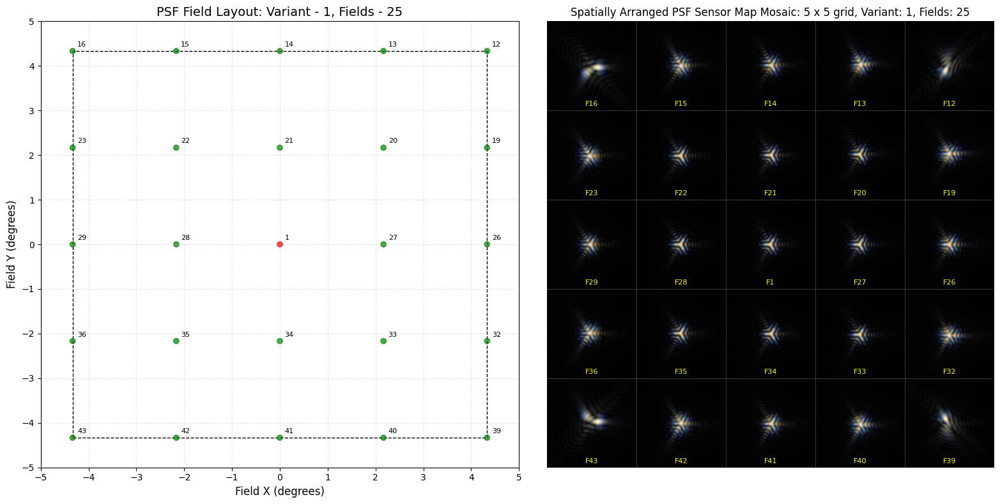

Loaded PSF library for variant: 2


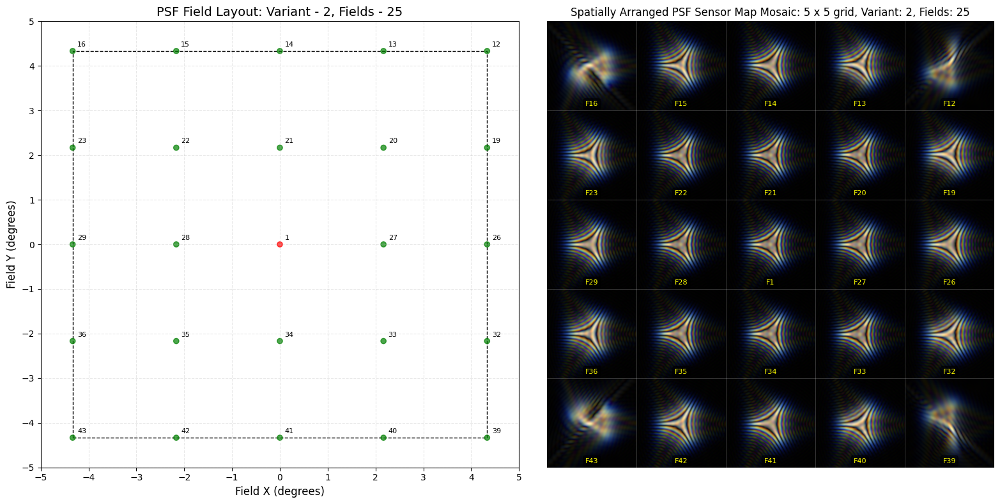

Loaded PSF library for variant: 3


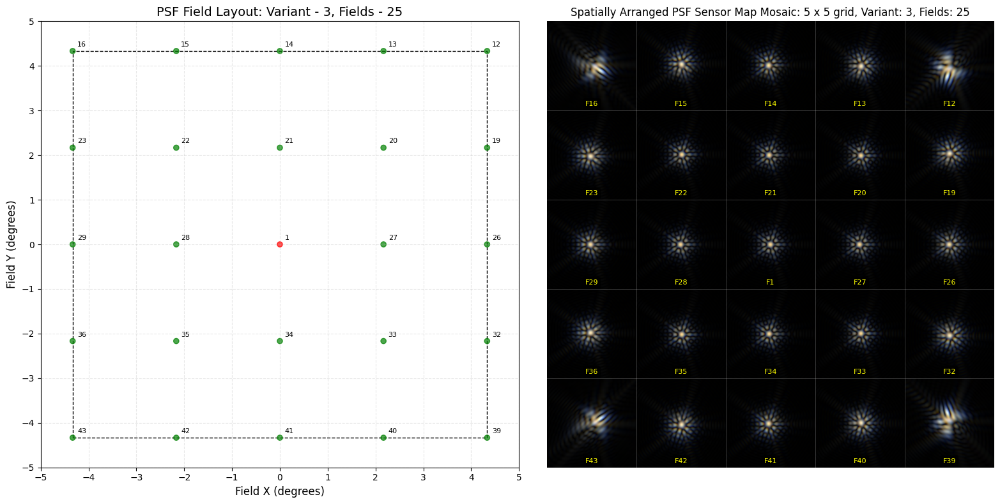

Loaded PSF library for variant: 4


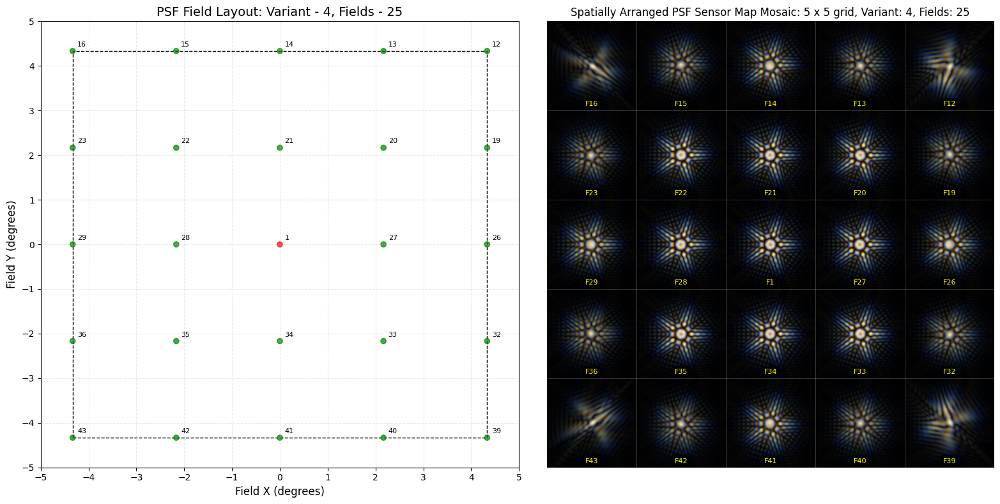

Loaded PSF library for variant: 5


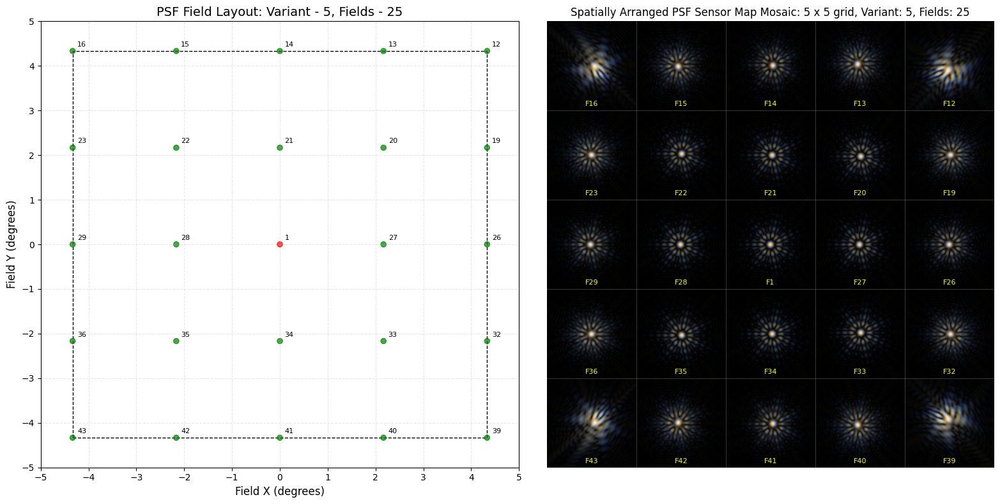

Loaded PSF library for variant: 6


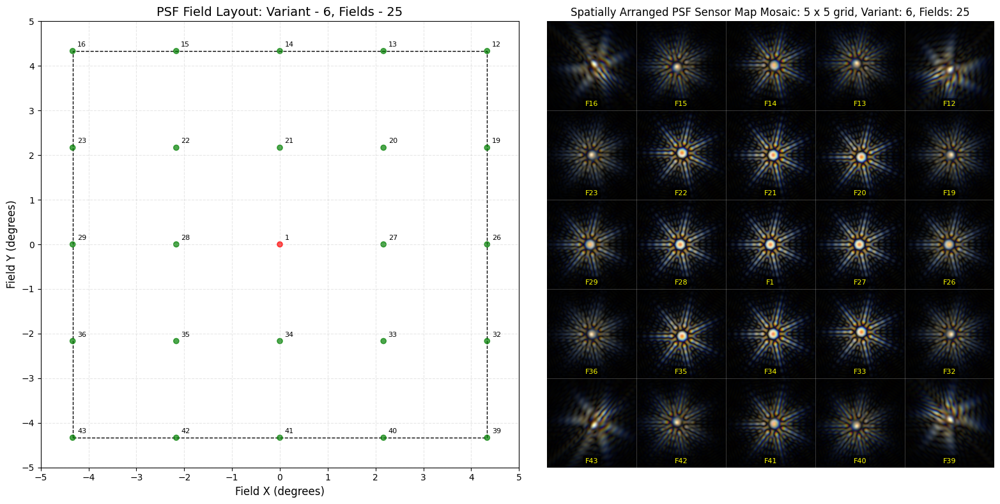

In [ ]:
target_dir = "star_psfs_separated"

# dead_fields = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 17, 18, 24, 25, 30, 31, 37, 38, 44, 45, 46, 47, 48, 49]

for variant in range(1, 7):
    # psf_library = build_psf_library(target_dir, variant, dead_fields=dead_fields)

    psf_library = load_psf_library(os.path.join(target_dir, f"psf_library_variant_{variant}.npz"))

    # visualize_psf_field_layout(psf_library)

    visualize_psf_grid(psf_library, crop_size=256)

In [10]:
def create_window_2d(size, window_type='hann', tukey_alpha=0.5):
    if window_type == 'hann':
        window_1d = signal.windows.hann(size, sym=True)
    elif window_type == 'tukey':
        window_1d = signal.windows.tukey(size, alpha=tukey_alpha, sym=True)
    elif window_type == 'bartlett':
        window_1d = signal.windows.bartlett(size)
    else:
        raise ValueError(f"Unknown window type: {window_type}. "
                        f"Supported: 'hann', 'tukey', 'bartlett'")

    window_2d = np.outer(window_1d, window_1d)

    return window_2d

In [36]:
def resize_psf(psf_rgb, target_size):
    H, W, _ = psf_rgb.shape
    if H == target_size and W == target_size:
        return psf_rgb

    zoom_factor = target_size / H
    resized = np.zeros((target_size, target_size, 3), dtype=np.float32)
    for c in range(3):
        resized[:, :, c] = zoom(psf_rgb[:, :, c], zoom_factor, order=1)
        resized[:, :, c] = resized[:, :, c] / (np.sum(resized[:, :, c]) + 1e-10)

    return resized

In [12]:
def crop_psf_center(rgb_psf, crop_size):
    H, W = rgb_psf.shape[:2]
    center_y, center_x = H // 2, W // 2
    half_crop = crop_size // 2

    y1 = max(0, center_y - half_crop)
    y2 = min(H, center_y + half_crop)
    x1 = max(0, center_x - half_crop)
    x2 = min(W, center_x + half_crop)

    rgb_psf_crop = rgb_psf[y1:y2, x1:x2, :]

    return rgb_psf_crop

In [13]:
def overlap_add_convolution(image, psf_library, patch_size=256, psf_crop_size=None, overlap_ratio=0.5, 
                            sensor_size_mm=(36.0, 24.0), visualize_fields=False, window_type='hann'):
    if image.max() > 1.0:
        image = image.astype(np.float32) / 255.0

    if image.ndim == 2:
        image = np.stack([image, image, image], axis=-1)

    H_orig, W_orig, C = image.shape

    pad_size = patch_size // 2
    image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='reflect')
    H, W, C = image.shape

    print(f"Original image size: {H_orig}x{W_orig}")
    print(f"Padded image size: {H}x{W} ({pad_size}px per side)")

    step_size = int(patch_size * (1 - overlap_ratio))
    num_patches_y = int(np.ceil((H - patch_size) / step_size)) + 1
    num_patches_x = int(np.ceil((W - patch_size) / step_size)) + 1

    output = np.zeros_like(image, dtype=np.float64)
    weight_map = np.zeros((H, W, C), dtype=np.float64)

    window_2d = create_window_2d(patch_size, window_type=window_type)
    window_2d = np.repeat(window_2d[:, :, np.newaxis], C, axis=2)

    kdtree = cKDTree(psf_library['field_positions_degrees'])

    pixel_to_mm_x = sensor_size_mm[0] / W
    pixel_to_mm_y = sensor_size_mm[1] / H
    center_x, center_y = W / 2, H / 2

    print(f"Processing with {patch_size}px patches")
    print(f"Overlap ratio: {overlap_ratio}, Step size: {step_size}px")
    print(f"Grid size: {num_patches_y} x {num_patches_x} patches\n")

    if visualize_fields:
        field_info = []  # stores (patch_center, field_number, sensor_pos)

    patch_count = 0

    for i in range(num_patches_y):
        y_start = min(i * step_size, H - patch_size)
        y_end = y_start + patch_size

        for j in range(num_patches_x):
            x_start = min(j * step_size, W - patch_size)
            x_end = x_start + patch_size

            actual_patch = image[y_start:y_end, x_start:x_end, :]

            patch_center_x = x_start + patch_size / 2
            patch_center_y = y_start + patch_size / 2

            pos_mm_x = (patch_center_x - center_x) * pixel_to_mm_x
            pos_mm_y = (center_y - patch_center_y) * pixel_to_mm_y  # flip y

            _, nearest_idx = kdtree.query((pos_mm_x, pos_mm_y), k=1)
            field_number = psf_library['field_numbers'][nearest_idx]
            psf = psf_library['psf_kernels'][field_number]

            if psf_crop_size is not None:
                psf = crop_psf_center(psf, psf_crop_size)
            psf = resize_psf(psf, patch_size)

            if visualize_fields:
                orig_center_x = patch_center_x - pad_size
                orig_center_y = patch_center_y - pad_size
                field_info.append({
                    'center': (orig_center_x, orig_center_y),
                    'field': field_number,
                    'sensor_pos': (pos_mm_x, pos_mm_y)
                })

            blurred_patch = np.zeros_like(actual_patch)
            for c in range(C):
                blurred_patch[:, :, c] = signal.fftconvolve(
                    actual_patch[:, :, c], 
                    psf[:, :, c], 
                    mode='same'
                )

            windowed_patch = blurred_patch * window_2d
            output[y_start:y_end, x_start:x_end, :] += windowed_patch
            weight_map[y_start:y_end, x_start:x_end, :] += window_2d

            patch_count += 1
            if patch_count % 100 == 0:
                print(f"Processed {patch_count}/{num_patches_y * num_patches_x} patches")
                _, axes = plt.subplots(1, 5, figsize=(20, 25))
                axes[0].imshow(actual_patch)
                axes[0].set_title('Actual Patch')

                axes[1].imshow(psf / (psf.max() + 1e-10))
                axes[1].set_title('PSF Kernel')

                axes[2].imshow(blurred_patch)
                axes[2].set_title('Blurred Patch')

                axes[3].imshow(windowed_patch)
                axes[3].set_title('Windowed Patch')

                axes[4].imshow(np.clip(windowed_patch / (window_2d + 1e-10), 0, 1))
                axes[4].set_title('Output Patch')
                plt.tight_layout()
                plt.show()

    output = output / (weight_map + 1e-10)
    output = output[pad_size:pad_size+H_orig, pad_size:pad_size+W_orig, :]
    output = np.clip(output, 0, 1.0)

    print(f"Total patches processed: {patch_count}")
    print(f"Output size: {output.shape[0]}x{output.shape[1]}")

    if visualize_fields:
        return output, field_info
    return output

In [14]:
def generate_point_source_grid(image_size=(2048, 2048), grid_spacing=256, point_width=3, intensity=1.0):
    H, W = image_size
    image = np.zeros((H, W, 3), dtype=np.float32)

    y_positions = np.arange(grid_spacing//2, H, grid_spacing)
    x_positions = np.arange(grid_spacing//2, W, grid_spacing)

    print(f"Creating {len(y_positions)} x {len(x_positions)} = {len(y_positions)*len(x_positions)} point sources")

    half_width = point_width // 2
    for y in y_positions:
        for x in x_positions:
            y1 = max(0, y - half_width)
            y2 = min(H, y + half_width + 1)
            x1 = max(0, x - half_width)
            x2 = min(W, x + half_width + 1)

            image[y1:y2, x1:x2, :] = intensity

    return image

In [32]:
def visualize_point_source_convolution(original_point_grid, blurred_point_grid, save_path=None):
    _, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(original_point_grid)
    axes[0].set_title('Original Point Sources')
    axes[0].axis('off')

    blurred_point_grid = blurred_point_grid / (blurred_point_grid.max() + 1e-10)
    axes[1].imshow(np.sqrt(blurred_point_grid))
    axes[1].set_title('After Shift-Variant PSF (Normalized for visualization)')
    axes[1].axis('off')

    plt.tight_layout()
    if save_path: 
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

Creating 8 x 8 = 64 point sources
Original image size: 2040x2040
Padded image size: 2552x2552 (256px per side)
Processing with 512px patches
Overlap ratio: 0.5, Step size: 256px
Grid size: 9 x 9 patches



Total patches processed: 81
Output size: 2040x2040


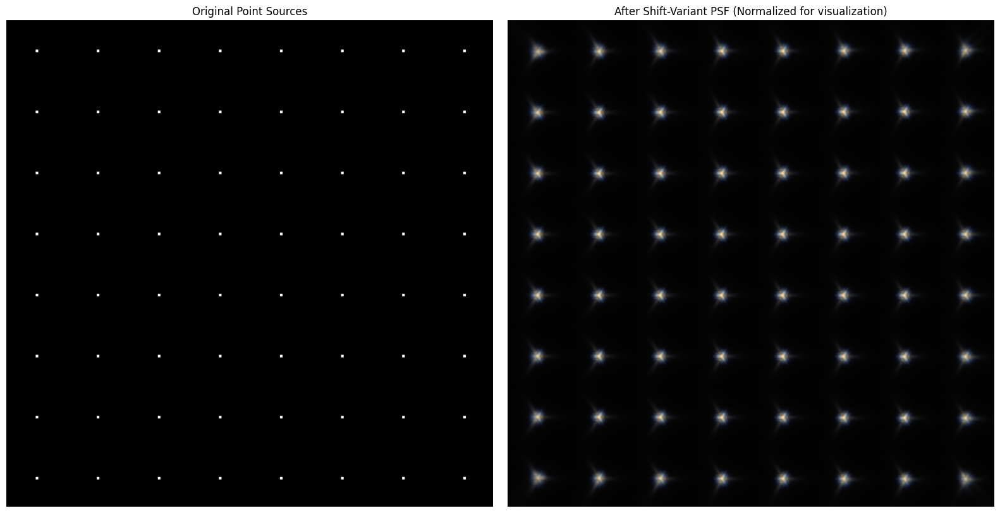

In [33]:
point_grid = generate_point_source_grid(
    image_size=(2040, 2040),
    grid_spacing=256,
    point_width=10,
    intensity=1.0
)

blurred_grid = overlap_add_convolution(
    point_grid,
    psf_library,
    patch_size=512,
    psf_crop_size=512,
    overlap_ratio=0.5,
    sensor_size_mm=(8.66, 8.66),
)

visualize_point_source_convolution(point_grid, blurred_grid)

In [20]:
def visualize_field_assignment(image, field_info, psf_library, save_path=None):
    if image.max() > 1.0:
        image = image / 255.0

    _, axes = plt.subplots(1, 3, figsize=(20, 7))

    variant = psf_library['variation_number']
    field_numbers = psf_library['field_numbers']
    field_positions = psf_library['field_positions_degrees']

    x_min, x_max = field_positions[:, 0].min(), field_positions[:, 0].max()
    y_min, y_max = field_positions[:, 1].min(), field_positions[:, 1].max()
    square = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, fill=False, linestyle='--')
    axes[0].add_patch(square)

    axes[0].scatter(
        field_positions[:, 0], field_positions[:, 1], 
        c=['red' if i == 0 and j == 0 else 'green' for i, j in zip(field_positions[:, 0], field_positions[:, 1])], 
        alpha=0.7, linewidth=1
        )

    for i, field_num in enumerate(field_numbers):
        axes[0].annotate(f'{field_num}', (field_positions[i, 0] + 0.1, field_positions[i, 1] + 0.1), fontsize=8)

    axes[0].grid(True, alpha=0.3, linestyle='--')    
    axes[0].set_xlabel('Field X (degrees)', fontsize=12)
    axes[0].set_ylabel('Field Y (degrees)', fontsize=12)
    axes[0].set_xticks(np.arange(np.floor(x_min), np.ceil(x_max) + 1))
    axes[0].set_yticks(np.arange(np.floor(y_min), np.ceil(y_max) + 1))
    axes[0].set_title(f'PSF Field Layout: Variant - {variant}, Fields - {len(field_numbers)}', fontsize=14)

    axes[1].imshow(image)
    for info in field_info:
        cx, cy = info['center']
        field = info['field']
        axes[1].plot(cx, cy, 'ro')
        axes[1].text(cx, cy, f'F{field}', fontsize=7, color='yellow', ha='center', va='bottom',
                    bbox=dict(boxstyle='round, pad=0.2', facecolor='black'))

    axes[1].set_title('Field Numbers Overlay', fontsize=14)
    axes[1].axis('off')

    field_counts = Counter([info['field'] for info in field_info])
    axes[2].bar(field_counts.keys(), field_counts.values(), color='skyblue')
    axes[2].set_xlabel('Field Number', fontsize=12)
    axes[2].set_ylabel('Number of Times Applied', fontsize=12)
    axes[2].set_title('PSF Field Usage Frequency', fontsize=14)

    plt.suptitle('PSF Field Assignment Visualization', fontsize=16)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

In [21]:
def visualize_comparison(original, blurred, crop_coords=None, save_path=None):
    if original.max() > 1.0:
        original = original / 255.0
    if blurred.max() > 1.0:
        blurred = blurred / 255.0

    H, W = original.shape[:2]

    if crop_coords is None:
        crop_size = min(H, W) // 4
        y = H // 2 - crop_size // 2
        x = W // 2 - crop_size // 2
    else:
        y, x, crop_size = crop_coords

    orig_crop = original[y:y+crop_size, x:x+crop_size]
    blur_crop = blurred[y:y+crop_size, x:x+crop_size]

    _, axes = plt.subplots(2, 2, figsize=(16, 16))
    axes = axes.flatten()

    # full images
    axes[0].imshow(original)
    axes[0].set_title('Original Image', fontsize=14)
    rect = plt.Rectangle((x, y), crop_size, crop_size, linewidth=2, edgecolor='red', facecolor='none')
    axes[0].add_patch(rect)
    axes[0].axis('off')

    axes[1].imshow(blurred)
    axes[1].set_title('Shift-Variant Blurred', fontsize=14)
    rect = plt.Rectangle((x, y), crop_size, crop_size, linewidth=2, edgecolor='red', facecolor='none')
    axes[1].add_patch(rect)
    axes[1].axis('off')

    # detail crops
    axes[2].imshow(orig_crop)
    axes[2].set_title('Original Image (Detail)', fontsize=14)
    axes[2].axis('off')

    axes[3].imshow(blur_crop)
    axes[3].set_title('Shift-Variant Blurred (Detail)', fontsize=14)
    axes[3].axis('off')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

Loaded PSF library for variant: 1
Test image shape: (2040, 2040, 3)
Original image size: 2040x2040
Padded image size: 2552x2552 (256px per side)
Processing with 512px patches
Overlap ratio: 0.5, Step size: 256px
Grid size: 9 x 9 patches

Total patches processed: 81
Output size: 2040x2040


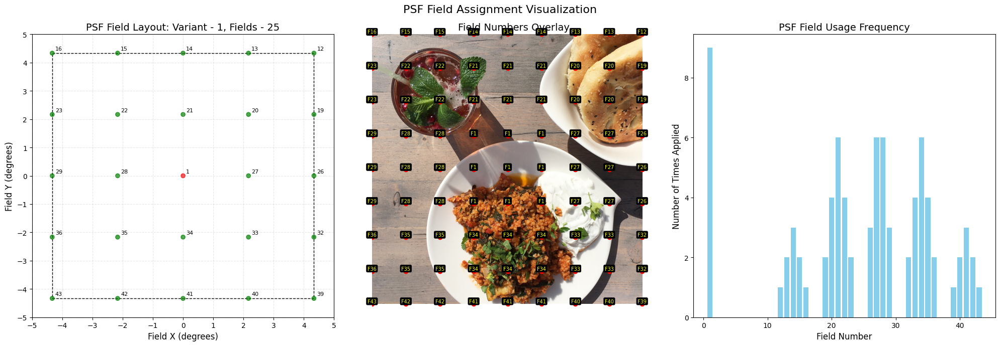

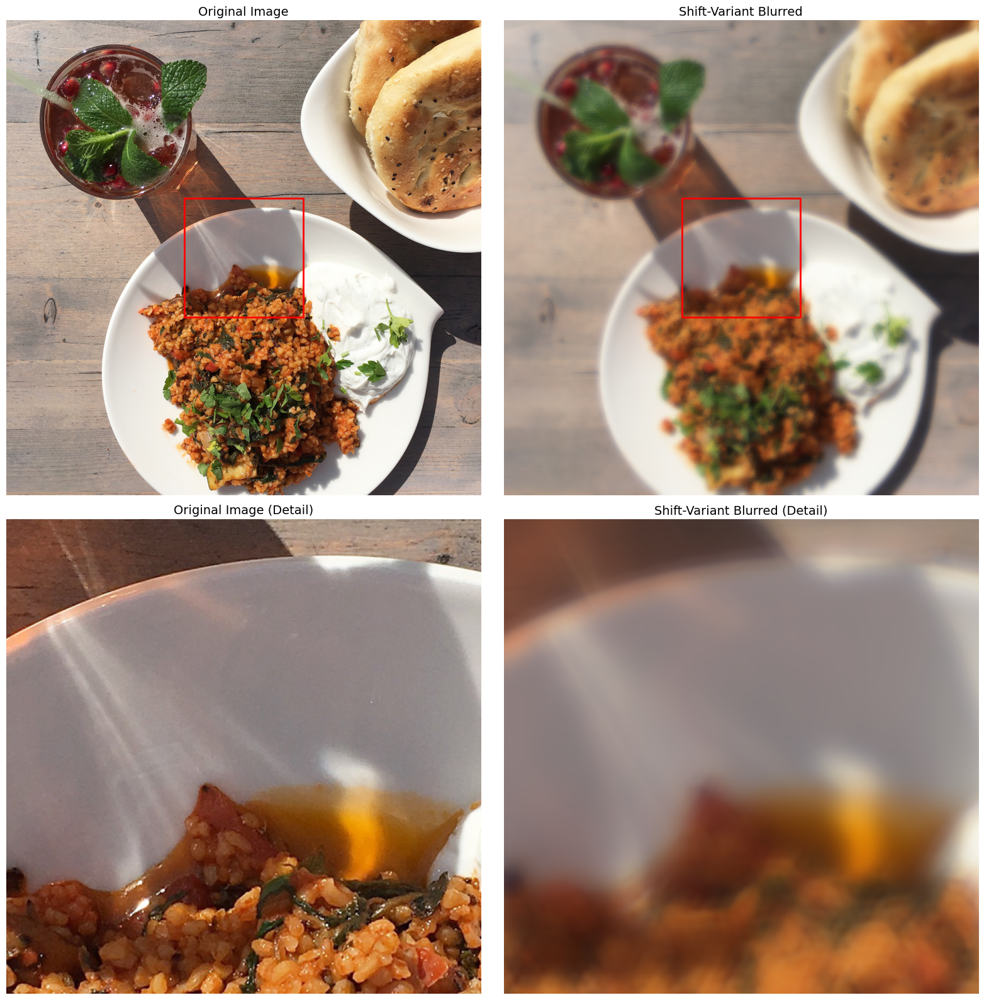

In [34]:
variant = 1
target_dir = "star_psfs_separated"
psf_library = load_psf_library(os.path.join(target_dir, f"psf_library_variant_{variant}.npz"))

test_image = plt.imread("000017.png")
print(f"Test image shape: {test_image.shape}")

blurred_image, field_info = overlap_add_convolution(
    test_image,
    psf_library,
    patch_size=512,
    psf_crop_size=512,
    overlap_ratio=0.5,
    sensor_size_mm=(8.66, 8.66),
    visualize_fields=True
)

visualize_field_assignment(test_image, field_info, psf_library)

visualize_comparison(test_image, blurred_image)

# plt.imsave("blurred_output.png", blurred_image)